# Baixando dependências

In [1]:
%pip install numpy
%pip install matplotlib
%pip install scipy
%pip install soundfile
%pip install Ipython

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


# Importando bibliotecas

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import soundfile as sf
import IPython.display as ipd

# Carregando o som do instrumento

In [5]:
canon_violin, fs = sf.read('Arquivos/Áudios/Canon_Violin.wav')
canon_violin.shape, fs

((2381400,), 44100)

# Carregando a resposta ao impulso real do ponto 5

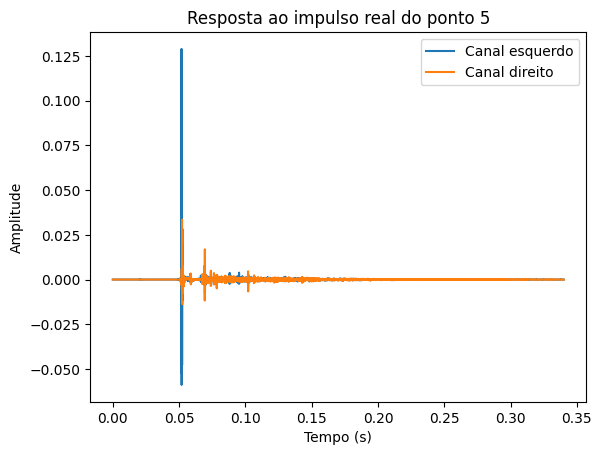

In [6]:
resp_imp_5_real = np.genfromtxt('Arquivos/Medições/SEC_5.csv', delimiter=',')
corte=15000
t=np.arange(0, len(resp_imp_5_real[:corte, 0]) * 1/fs, 1/fs)
plt.plot(t, resp_imp_5_real[:corte, 1], label='Canal esquerdo')
plt.plot(t, resp_imp_5_real[:corte, 0], label='Canal direito')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.title('Resposta ao impulso real do ponto 5')
plt.legend()

# Convoluindo com o mesmo áudio da parte 3

In [7]:
saida_pt4_esq = sp.signal.fftconvolve(canon_violin, resp_imp_5_real[:, 1])
saida_pt4_dir = sp.signal.fftconvolve(canon_violin, resp_imp_5_real[:, 0])

# Unindo em um só

In [8]:
saida_pt4 = np.vstack((saida_pt4_esq, saida_pt4_dir)).transpose()

# Mostrando a saída

/home/caio/.local/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


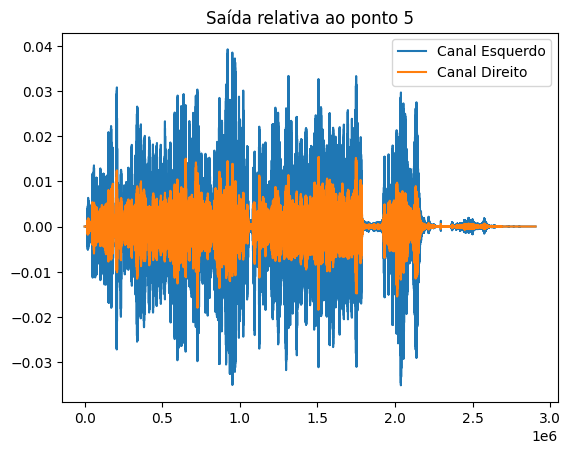

In [9]:
plt.plot(saida_pt4_esq, label="Canal Esquerdo")
plt.plot(saida_pt4_dir, label="Canal Direito")
plt.legend()
plt.title("Saída relativa ao ponto 5")
plt.show()

# Salvando o resultado

In [10]:
sf.write("Arquivos/Saídas/saida_pt4.wav", saida_pt4, fs)
ipd.Audio(filename='Arquivos/Saídas/saida_pt4.wav',)